In [1]:
!pip install mmcv-full
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
!cd mmdetection && pip install -e .

### Download model checkpoint

In [2]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth \
      -O checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth

In [3]:
import os
import sys
import json
import matplotlib.patches as patches
import tqdm
from PIL import Image

DATA_DIR  = "../input/russian-road-signs-segmentation-dataset/sign_dataset"
TRAIN_DIR = os.path.join(DATA_DIR, "train")
VAL_DIR   = os.path.join(DATA_DIR, "val")

sys.path.append("mmdetection")

In [4]:
import mmcv
from mmdet.apis import inference_detector, show_result_pyplot

/opt/conda/lib/python3.7/site-packages/mmcv/__init__.py:21: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mmlab/mmcv/blob/master/docs/en/compatibility.md for more details.
  'On January 1, 2023, MMCV will release v2.0.0, in which it will remove '


### Processing segmentation masks to `Coco` format

In [5]:
def patch_to_coords(figure):
    path      = figure.get_path()
    transform = figure.get_transform()
    newpath   = transform.transform_path(path)
    points    = newpath.to_polygons()[0]
    
    return [c for point in points for c in point]

def circle_to_polygon(region: dict):
    cx, cy, r  = region["cx"], region["cy"], region["r"]
    x, y, w, h = cx - r, cy - r, 2 * r, 2 * r
    polygon    = patch_to_coords(patches.Circle(xy=(cx, cy), radius=r))
    
    return polygon, x, y, w, h

def ellipse_to_polygon(region: dict):
    cx, cy, rx, ry = region["cx"], region["cy"], region["rx"], region["ry"]
    x,  y,  w,  h  = cx - rx, cy - ry, 2 * rx, 2 * ry
    polygon        = patch_to_coords(patches.Ellipse(xy=(cx, cy), width=w, height=h))
    
    return polygon, x, y, w, h

def rect_to_polygon(region: dict):
    x, y, w, h = region["x"], region["y"], region["width"], region["height"]
    poly       = [x, y, x, y + h, x + w, y + h, x + w, y, x, y]
    
    return poly, x, y, w, h
    
def to_polygon(region: dict, figure: str):
    if figure == "rect":
        return rect_to_polygon(region)
    elif figure == "circle":
        return circle_to_polygon(region)
    elif figure == "ellipse":
        return ellipse_to_polygon(region)
    else:
        xs, ys = region["all_points_x"], region["all_points_y"]
        x, y   = min(xs),     min(ys)
        w, h   = max(xs) - x, max(ys) - y
        poly   = [p for point in zip(xs, ys) for p in point]
        
        return poly, x, y, w, h
        

def parse_region(region: dict):
    if "shape_attributes" not in region:
        return None
    
    if region["region_attributes"].get("name") != "road sign":
        return None
    
    region = region["shape_attributes"]
    figure = region["name"]
    
    return to_polygon(region, figure)


def to_coco(ann_path: str, image_folder: str):
    
    with open(ann_path, "r") as f:
        ann = json.load(f)
    
    annots  = []
    images  = []
    objects = 0
    
    for image_id, image_ann in tqdm.tqdm(enumerate(ann.values())):
        file_name = image_ann["filename"]
        regions   = image_ann["regions"].values()
        image     = Image.open(os.path.join(image_folder, file_name))
        
        image_data = {
            "id"        : image_id,
            "file_name" : file_name,
            "width"     : image.width,
            "height"    : image.height
        }
        
        images.append(image_data)
        
        for region in regions:
            parsed = parse_region(region)

            if parsed is None:
                continue
            
            poly, x, y, w, h = parsed
            
            region_data = {
                "image_id"    : image_id,
                "id"          : objects,
                "area"        : w * h,
                "bbox"        : [x, y, w, h],
                "segmentation": [poly],
                "category_id" : 0,
                "iscrowd"     : 0
            }
            
            annots.append(region_data)
            objects += 1
    
    coco_format_json = dict(
        images=images,
        annotations=annots,
        categories=[{"id": 0, "name": "road-sign"}]
    )
    
    return coco_format_json

In [6]:
train_annotations = to_coco(
    ann_path=os.path.join(TRAIN_DIR, "via_region_data.json"), 
    image_folder=TRAIN_DIR
)

test_annotations = to_coco(
    ann_path=os.path.join(VAL_DIR, "via_region_data.json"),
    image_folder=VAL_DIR
)

with open("coco_train.json", "w") as f:
    json.dump(train_annotations, f)
    
with open("coco_test.json", "w") as f:
    json.dump(test_annotations, f)

2054it [00:01, 1267.76it/s]
127it [00:00, 521.83it/s]


In [7]:
from mmcv import Config

cfg = Config.fromfile('mmdetection/configs/mask_rcnn/mask_rcnn_r50_caffe_fpn_mstrain-poly_1x_coco.py')

### Configure model training parameters

In [11]:
cfg.dataset_type = "COCODataset"

cfg.data.test.ann_file = "coco_test.json"
cfg.data.test.img_prefix = VAL_DIR
cfg.data.test.classes = ("road-sign",)

cfg.data.train.ann_file = "coco_train.json"
cfg.data.train.img_prefix = TRAIN_DIR
cfg.data.train.classes = ("road-sign",)

cfg.data.val.ann_file = "coco_test.json"
cfg.data.val.img_prefix = VAL_DIR
cfg.data.val.classes = ("road-sign",)

cfg.model.roi_head.bbox_head.num_classes = 1
cfg.model.roi_head.mask_head.num_classes = 1

cfg.load_from = "checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth"

cfg.work_dir = "./exps"

cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.log_config.interval = 10

cfg.evaluation.interval = 1
cfg.checkpoint_config.interval = 1

cfg.seed = 239
cfg.gpu_ids = range(1)
cfg.runner.max_epochs = 4
cfg.device = "cuda"

cfg.log_config.hooks = [
    dict(type="TextLoggerHook"),
    dict(type="TensorboardLoggerHook")
]


print(f"Config:\n{cfg.pretty_text}")

Config:
model = dict(
    type='MaskRCNN',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe',
        init_cfg=dict(
            type='Pretrained',
            checkpoint='open-mmlab://detectron2/resnet50_caffe')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='Cross

In [12]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


datasets = [build_dataset(cfg.data.train)]
model = build_detector(cfg.model)
model.CLASSES = datasets[0].CLASSES

mmcv.mkdir_or_exist(os.path.abspath(cfg.work_dir))

loading annotations into memory...
Done (t=0.06s)
creating index...
index created!


In [13]:
train_detector(model, datasets, cfg, distributed=False, validate=True)

2022-11-08 21:23:16,528 - mmdet - INFO - Automatic scaling of learning rate (LR) has been disabled.
2022-11-08 21:23:16,541 - mmdet - INFO - load checkpoint from local path: checkpoints/mask_rcnn_r50_caffe_fpn_mstrain-poly_3x_coco_bbox_mAP-0.408__segm_mAP-0.37_20200504_163245-42aa3d00.pth
2022-11-08 21:23:16,712 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for roi_head.bbox_head.fc_cls.weight: copying a param with shape torch.Size([81, 1024]) from checkpoint, the shape in current model is torch.Size([2, 1024]).
size mismatch for roi_head.bbox_head.fc_cls.bias: copying a param with shape torch.Size([81]) from checkpoint, the shape in current model is torch.Size([2]).
size mismatch for roi_head.bbox_head.fc_reg.weight: copying a param with shape torch.Size([320, 1024]) from checkpoint, the shape in current model is torch.Size([4, 1024]).
size mismatch for roi_head.bbox_head.fc_reg.bias: copying a param with shape torch.Size([320]) from checkpoin

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


2022-11-08 21:23:25,644 - mmdet - INFO - Epoch [1][10/1027]	lr: 2.500e-03, eta: 0:49:51, time: 0.730, data_time: 0.244, memory: 3521, loss_rpn_cls: 0.1440, loss_rpn_bbox: 0.0160, loss_cls: 0.3043, acc: 87.0703, loss_bbox: 0.1443, loss_mask: 0.5618, loss: 1.1705
2022-11-08 21:23:28,728 - mmdet - INFO - Epoch [1][20/1027]	lr: 2.500e-03, eta: 0:35:25, time: 0.310, data_time: 0.024, memory: 3521, loss_rpn_cls: 0.0445, loss_rpn_bbox: 0.0063, loss_cls: 0.0777, acc: 96.4648, loss_bbox: 0.1208, loss_mask: 0.2802, loss: 0.5295
2022-11-08 21:23:31,984 - mmdet - INFO - Epoch [1][30/1027]	lr: 2.500e-03, eta: 0:30:53, time: 0.323, data_time: 0.022, memory: 3521, loss_rpn_cls: 0.0178, loss_rpn_bbox: 0.0098, loss_cls: 0.0828, acc: 95.8008, loss_bbox: 0.1756, loss_mask: 0.2306, loss: 0.5167
2022-11-08 21:23:35,149 - mmdet - INFO - Epoch [1][40/1027]	lr: 2.500e-03, eta: 0:28:30, time: 0.318, data_time: 0.024, memory: 3521, loss_rpn_cls: 0.0130, loss_rpn_bbox: 0.0092, loss_cls: 0.0733, acc: 97.2070, los

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 6.8 task/s, elapsed: 19s, ETA:     0s

2022-11-08 21:29:30,358 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-11-08 21:29:30,519 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.634
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.896
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.807
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.603
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.653
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.645
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.710
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.710
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.710
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.703
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.723
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.12s).
Accumulating evaluation results...
DONE (t=0.04s).
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.13s).
Accumulating evaluation results...


2022-11-08 21:29:30,705 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.596
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.887
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.747
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.473
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.652
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.647
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.683
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.683
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.683
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.678
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.692
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.04s).


/kaggle/working/mmdetection/mmdet/core/mask/structures.py:1071: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bitmap_mask = maskUtils.decode(rle).astype(np.bool)
2022-11-08 21:29:36,531 - mmdet - INFO - Epoch [2][10/1027]	lr: 2.500e-03, eta: 0:17:33, time: 0.567, data_time: 0.238, memory: 3521, loss_rpn_cls: 0.0149, loss_rpn_bbox: 0.0139, loss_cls: 0.0683, acc: 97.4023, loss_bbox: 0.1213, loss_mask: 0.1605, loss: 0.3790
2022-11-08 21:29:39,913 - mmdet - INFO - Epoch [2][20/1027]	lr: 2.500e-03, eta: 0:17:29, time: 0.341, data_time: 0.025, memory: 3521, loss_rpn_cls: 0.0128, loss_rpn_bbox: 0.0213, loss_cls: 0.0552, acc: 97.9102, loss_bbox: 0.1000, loss_mask: 0.1716, lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 7.2 task/s, elapsed: 18s, ETA:     0s

/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f7885af4440>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f7885af4440>
  self.pid = os.fork()
2022-11-08 21:35:41,210 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-11-08 21:35:41,341 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.643
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.912
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.788
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.584
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.666
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.666
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.716
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.716
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.716
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.642
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.742
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.10s).
Accumulating evaluation results...
DONE (t=0.03s).
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*


2022-11-08 21:35:41,494 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.616
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.903
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.755
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.665
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.634
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.685
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.685
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.685
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.658
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.704
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.11s).
Accumulating evaluation results...
DONE (t=0.03s).


/kaggle/working/mmdetection/mmdet/core/mask/structures.py:1071: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bitmap_mask = maskUtils.decode(rle).astype(np.bool)
2022-11-08 21:35:47,223 - mmdet - INFO - Epoch [3][10/1027]	lr: 2.500e-03, eta: 0:11:37, time: 0.557, data_time: 0.237, memory: 3521, loss_rpn_cls: 0.0140, loss_rpn_bbox: 0.0175, loss_cls: 0.0502, acc: 98.2422, loss_bbox: 0.0939, loss_mask: 0.1513, loss: 0.3270
2022-11-08 21:35:50,479 - mmdet - INFO - Epoch [3][20/1027]	lr: 2.500e-03, eta: 0:11:34, time: 0.327, data_time: 0.024, memory: 3521, loss_rpn_cls: 0.0063, loss_rpn_bbox: 0.0085, loss_cls: 0.0504, acc: 97.8711, loss_bbox: 0.0854, loss_mask: 0.1574, lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 7.2 task/s, elapsed: 18s, ETA:     0s

/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f7885af4440>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f7885af4440>
  self.pid = os.fork()
2022-11-08 21:41:53,800 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*


2022-11-08 21:41:53,940 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.675
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.925
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.824
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.637
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.696
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.677
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.736
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.736
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.736
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.728
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.750
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.11s).
Accumulating evaluation results...
DONE (t=0.03s).
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*


2022-11-08 21:41:54,092 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.609
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.905
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.724
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.526
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.652
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.621
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.680
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.680
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.680
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.703
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.689
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.11s).
Accumulating evaluation results...
DONE (t=0.03s).


/kaggle/working/mmdetection/mmdet/core/mask/structures.py:1071: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bitmap_mask = maskUtils.decode(rle).astype(np.bool)
2022-11-08 21:41:59,950 - mmdet - INFO - Epoch [4][10/1027]	lr: 2.500e-03, eta: 0:05:47, time: 0.570, data_time: 0.243, memory: 3609, loss_rpn_cls: 0.0030, loss_rpn_bbox: 0.0107, loss_cls: 0.0517, acc: 97.9199, loss_bbox: 0.0993, loss_mask: 0.1662, loss: 0.3309
2022-11-08 21:42:03,337 - mmdet - INFO - Epoch [4][20/1027]	lr: 2.500e-03, eta: 0:05:43, time: 0.340, data_time: 0.025, memory: 3609, loss_rpn_cls: 0.0028, loss_rpn_bbox: 0.0093, loss_cls: 0.0411, acc: 98.2520, loss_bbox: 0.0779, loss_mask: 0.1505, lo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 127/127, 7.4 task/s, elapsed: 17s, ETA:     0s

/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f7885af4440>
  self.pid = os.fork()
/opt/conda/lib/python3.7/multiprocessing/popen_fork.py:70: ResourceWarning: unclosed socket <zmq.Socket(zmq.PUSH) at 0x7f7885af4440>
  self.pid = os.fork()
2022-11-08 21:48:06,280 - mmdet - INFO - Evaluating bbox...


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.09s).
Accumulating evaluation results...


2022-11-08 21:48:06,408 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.694
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.921
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.864
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.673
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.708
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.713
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.751
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.751
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.751
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.729
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.765
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.03s).
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *segm*
DONE (t=0.11s).
Accumulating evaluation results...


2022-11-08 21:48:06,562 - mmdet - INFO - 
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.641
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=1000 ] = 0.916
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=1000 ] = 0.788
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.564
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.681
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=1000 ] = 0.634
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.701
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=300 ] = 0.701
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=1000 ] = 0.701
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=1000 ] = 0.694
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=1000 ] = 0.717
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=1000

DONE (t=0.03s).


In [14]:
import torch

torch.save(model, "road-signs-segmentor.pth")

/kaggle/working/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)


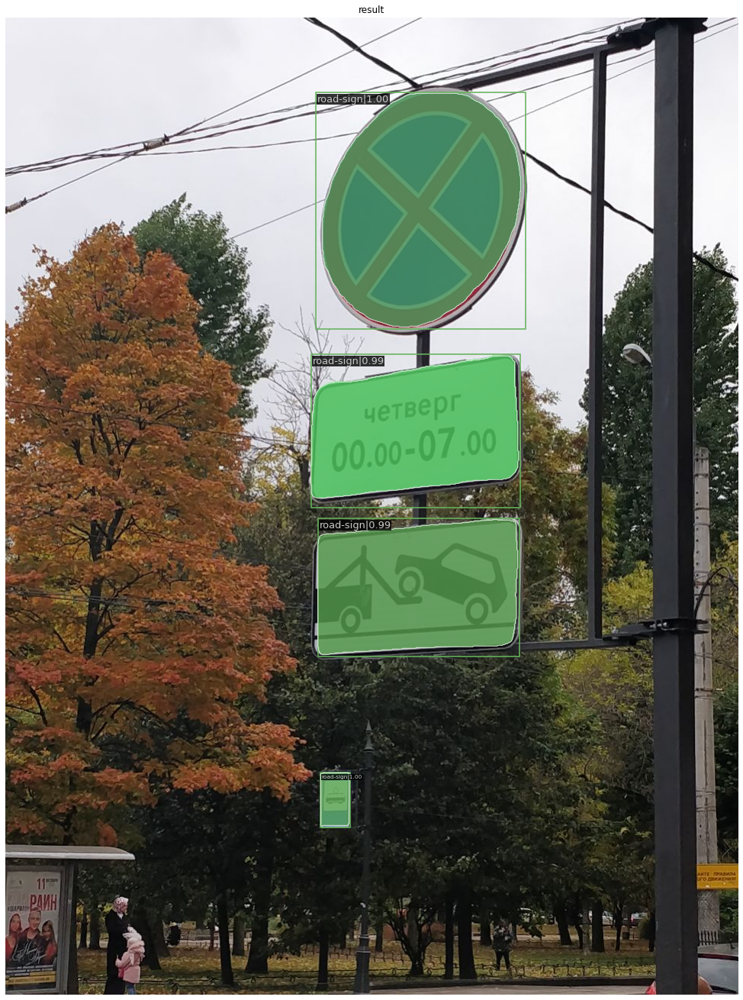

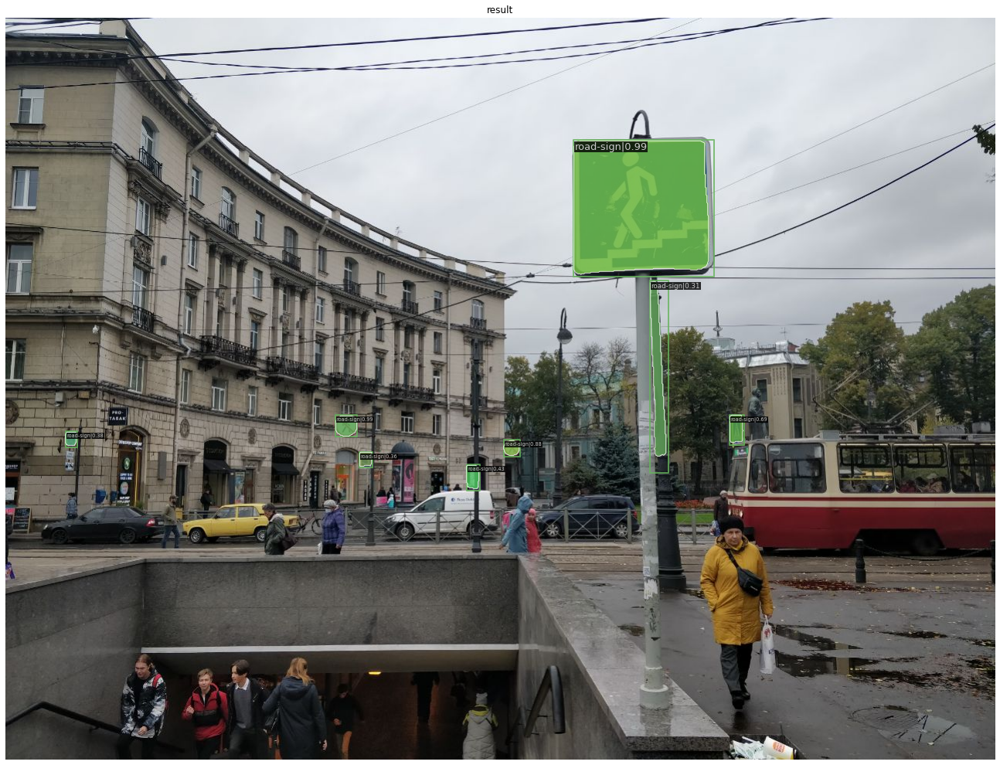

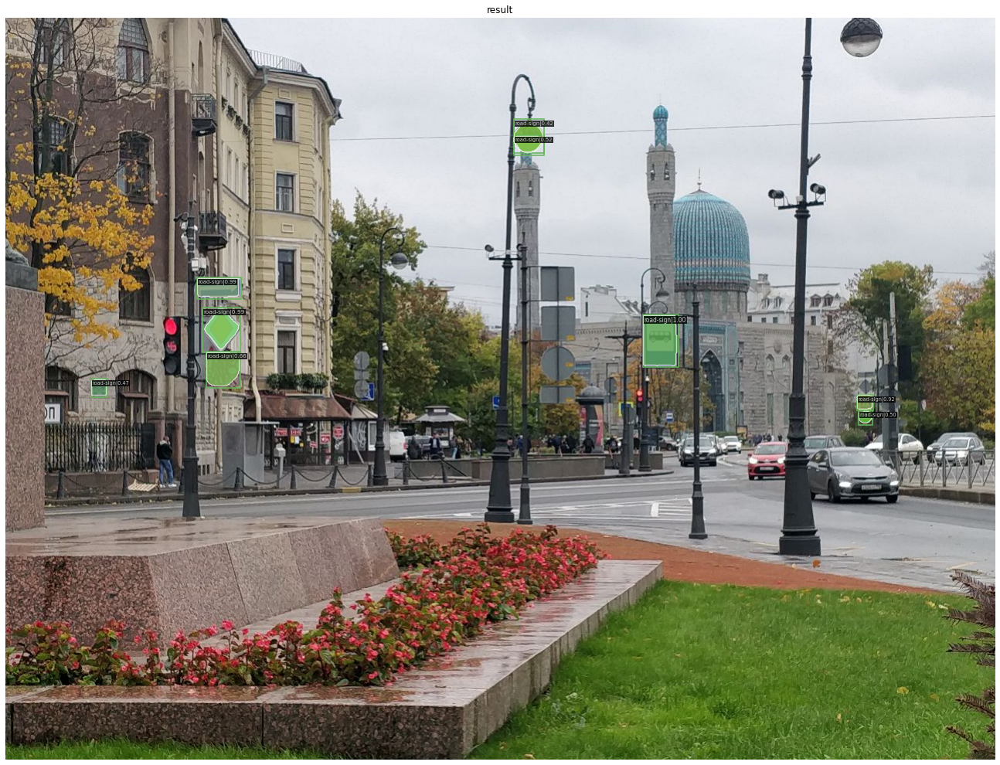

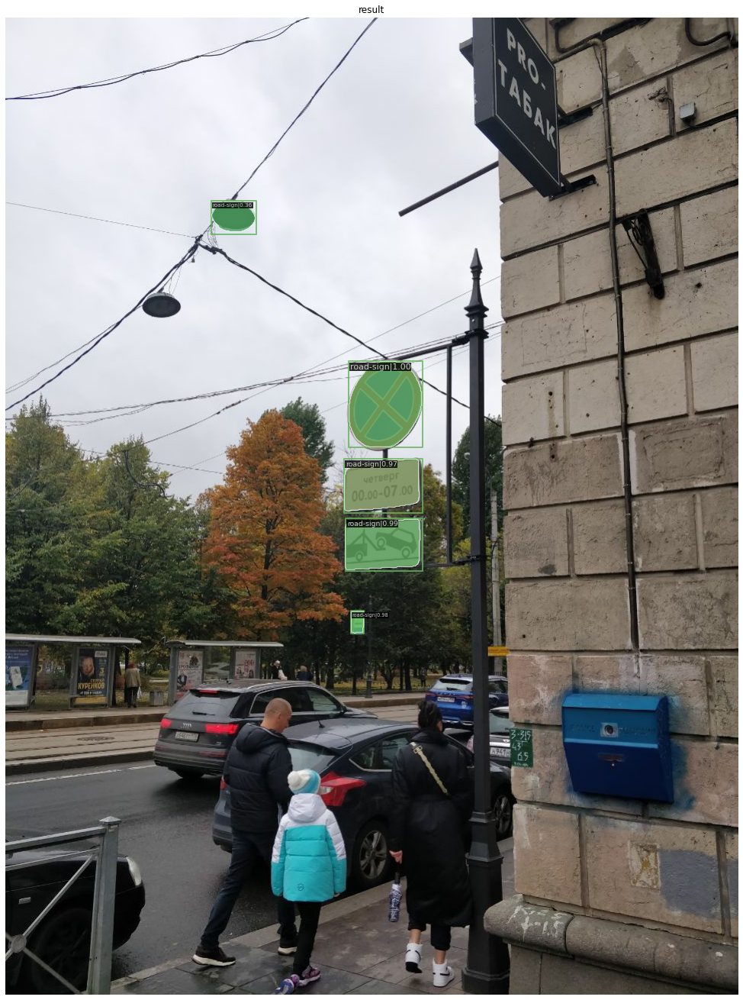

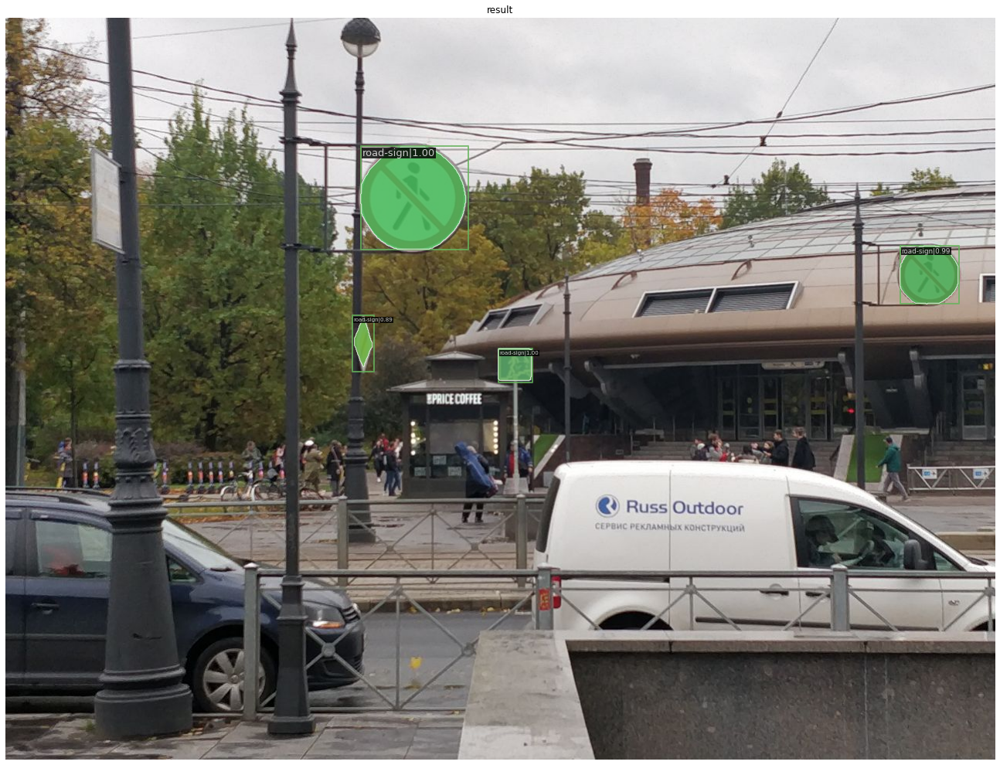

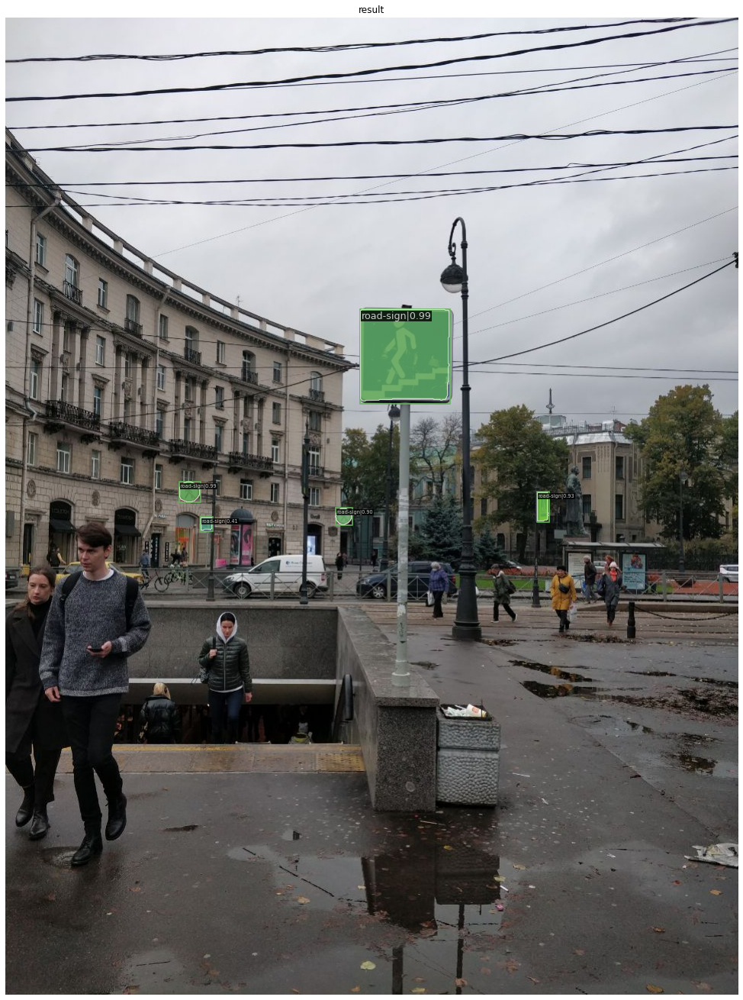

In [15]:
test_dir = "../input/roadsigns"
model.cfg = cfg

for file in os.listdir(test_dir):
        img = mmcv.imread(os.path.join(test_dir, file))
        result = inference_detector(model, img)
        show_result_pyplot(model, img, result)